<center> <h1 style="background-color:none; color:black; font-size:36px; font-weight:bold; font-family:Adobe Hebrew;" >Explanotry Data Analysis and Comparison  of Machine learning Algorithms for BigMart Sales Prediction</h1></center>

**`Project Description`**

Big Mart, a prominent retail chain with both online and offline stores, seeks to optimize its sales strategy by analyzing historical sales data from 2013. This data includes sales figures for 1559 products across 10 stores located in different cities. Each entry is associated with specific product and store attributes. The goal of this project is to predict future sales for individual products at specific stores. As a data scientist, your task is to explore this dataset through Exploratory Data Analysis (EDA) and build a predictive model that can accurately forecast product sales, aiding in the company’s strategic decision-making.

**`Main project Tasks`**

**`I. Data Loading, Cleaning and Preprocessing`**

- Dataset Acquisition: Use the Kaggle API to download the dataset directly into the working directory, whether on a local machine or cloud storage.
- Overview Development: Start by gaining a thorough understanding of the dataset. This involves examining data types, structure, and summary statistics to identify any errors, inconsistencies, or patterns. This initial analysis will guide the subsequent data cleaning and
preprocessing steps.
- Handling Missing Values and Duplicates: Identify and address any missing values and duplicates within the dataset to ensure data integrity.
- Correcting Data Irregularities: Ensure that all data entries adhere to a consistent schema, identifying and correcting any irregularities in the data.
- Outlier Detection and Treatment: Inspect the data for outliers and apply appropriate treatment methods to minimize their impact on the analysis.

**`II. Explanotary Data Analysis (EDA) **


- During EDA, leverage visual tools such as histograms, box plots, scatterplots, and density plots to explore the features and target data. This process involves:

- Univariate Analysis: Understand the distribution and central tendency of individual features.
Bivariate and Multivariate Analysis: Explore relationships between multiple features and how they interact with the target variable.
Time Series Analysis: If applicable, analyze any temporal patterns within the dataset, providing insights for feature engineering and model building.


**`III. Feature Engineering`**

- Feature engineering involves transforming raw data into more meaningful inputs for machine learning models:

- Identifying Relevant Features: Based on insights from EDA, select the most relevant features using domain knowledge or feature selection algorithms.
- Creating New Features: Develop new features from existing data, such as lag features or extracting meaningful information from timestamps.
- Encoding and Scaling: Transform categorical variables into numerical representations using techniques like label encoding or one-hot encoding. Scale features to ensure uniformity, which can enhance the performance of certain algorithms.


**`IV. Model Selection, Evaluation, and Hyperparameter Tuning`**

With the prepared data, proceed to model development:

- Model Selection: Choose suitable models that balance predictive accuracy, computational efficiency, and interpretability.
- Model Evaluation: Assess model performance on unseen data using appropriate metrics for regression, such as squared error. Apply cross-validation to obtain reliable performance estimates by testing the model on various data subsets.
- Hyperparameter Tuning: Optimize the chosen model’s hyperparameters to enhance its predictive performance further.


Finally, validate the model using test data, identify the most influential features, and save the trained model for future use.

<left> <h1 style="color:black; font-size:32px; font-weight:bold; font-family:Adobe Garamond Pro;" >1. Importing Libraries and frameworks required for the Project</h1></left>

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error , mean_squared_error , r2_score

In [3]:
#for visualization- we use matplotlib, seaborn and ploty
import matplotlib.pyplot as plt # 
import seaborn as sns
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats("svg")
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots # plot subplot with plotly.graph_objects

def set_default_style():
    plt.style.use(['ggplot'])
    plt.rc('font', family='Adobe Garamond Pro')
    plt.rc('axes', edgecolor='w', titlesize=12, titleweight='bold', labelweight='bold', labelsize=10, grid=False)
    plt.rc('text', color='tomato')
    plt.rc('figure', figsize=(9, 3.5), dpi=150)
    # for ploty plot
    px.defaults.template = 'seaborn'
    px.defaults.width = 900
    px.defaults.height = 350
    px.defaults.color_continuous_scale = px.colors.sequential.Plasma_r 
    px.defaults.color_discrete_sequence = px.colors.qualitative.T10
set_default_style()

pd.set_option('display.max_columns', 100) 
pd.set_option('display.width', 200) 
np.random.seed(0) # set seed for reproductibility
import warnings
warnings.filterwarnings("ignore") 

# **<font color="black" size="6" face="Adobe Garamond Pro">2. Importing the dataset</font>**

In [4]:
import os
for dirname, _, filenames in os.walk('./dataset'):
      for filename in filenames:
        print(os.path.join(dirname, filename))

In [5]:
#reading the dataset of train and test
df_train = pd.read_csv("./datasets/train.csv") # used for training and validationset of the model
df_test = pd.read_csv("./datasets/test.csv") # unseen data which will be used for testing the trained model
df_train.head(5) 

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


# **<font color="black" size="6" face="Adobe Garamond Pro">3. Data Cleaning and Pre-Preprocessing</font>**
- Develop an Overview: Start by creating a comprehensive summary of the dataset. This should include key details such as data types, structure, and summary statistics. This overview will help you identify any errors, inconsistencies, or patterns within the data, guiding the subsequent cleaning and preprocessing steps.

- Handling Missing Values and Duplicates: Identify any missing values and duplicate records in the dataset, and address them to ensure data integrity.

- Addressing Data Irregularities: Ensure consistency across the dataset by identifying and correcting any irregularities in data entries, such as mismatches in the data schema.

- Outlier Detection and Treatment: Inspect the dataset for outliers, and apply appropriate methods to treat them, ensuring they do not adversely affect the analysis.

## `3.1 Exploring the imported datasets`

In [5]:
# Explore dataset accross data schema
def explore_dataset(dfs):
    summary = []
    for column in dfs.columns:
        data_type = dfs[column].dtype
        total_count = len(dfs[column])
        unique_count = dfs[column].nunique()
        unique_sample = dfs[column].unique()[0:5]
        missing_values = dfs[column].isnull().sum()
        summary.append({'Column': column, 'Data Type': data_type, 'total count': total_count,
                        'Unique Count': unique_count, 'Unique Sample': unique_sample, 
                        'Missing Values': missing_values})
    return pd.DataFrame(summary)

# Explore dataset instances- Duplicata count and print all if less than 10, else print only head() 
def count_and_print_duplicates(dfs):
    dup_rows= dfs[dfs.duplicated()]
    dup_rows_count = len(dup_rows)
    if 1 < dup_rows_count <= 10: 
        print(f"Number of duplicate rows: {dup_rows_count} --> Duplicate rows are: \n {dup_rows}")
    elif dup_rows_count > 10: 
        print(f"Number of duplicate rows: {dup_rows_count} --> Duplicate rows are: \n {dup_rows.head()}")
    else:
        print("No duplicate rows found.")
        
datasets = [("Training dataset", df_train), ("Testing dataset", df_test)]
for idx, (dataset_name, dataset) in enumerate(datasets, start=1):
    print(f"{idx}. Explore {dataset_name} key details:")
    print(explore_dataset(dataset))
    print("￣ ￣ ￣"*10 if idx != len(datasets) else "\n")

print("3. Duplicate instances check and count")
for idx, (dataset_name, dataset) in enumerate(datasets, start=1):
    print(f"{idx}. {dataset_name} duplicate instances counts:")
    count_and_print_duplicates(dataset)
    print("￣ ￣ ￣"*10 if idx != len(datasets) else "\n")

1. Explore Training dataset key details:
                       Column Data Type  total count  Unique Count                                      Unique Sample  Missing Values
0             Item_Identifier    object         8523          1559                [FDA15, DRC01, FDN15, FDX07, NCD19]               0
1                 Item_Weight   float64         8523           415                      [9.3, 5.92, 17.5, 19.2, 8.93]            1463
2            Item_Fat_Content    object         8523             5               [Low Fat, Regular, low fat, LF, reg]               0
3             Item_Visibility   float64         8523          7880  [0.016047301, 0.019278216, 0.016760075, 0.0, 0...               0
4                   Item_Type    object         8523            16  [Dairy, Soft Drinks, Meat, Fruits and Vegetabl...               0
5                    Item_MRP   float64         8523          5938     [249.8092, 48.2692, 141.618, 182.095, 53.8614]               0
6           Outlet_Id

**`Observation from dataset exploring`**

- The training set consists of 8,523 instances with 12 features, giving it a shape of (8523, 12). The test set has fewer instances, with 5,681 rows and 11 features. The target feature for prediction is Item_Outlet_Sales. The dataset includes both categorical and numerical features.

Categorical Features:

- Item_Identifier: Product ID (likely to be dropped later as it's not useful for prediction).
- Item_Fat_Content: Indicates whether the product's fat content is low, high, or none.
- Item_Type: The category of the item, such as Dairy, Meat, Fruits, etc.
- Outlet_Identifier: The store's ID or name.
- Outlet_Size: Size of the store, which could relate to area or sales volume.
- Outlet_Location_Type: Categorization of store location based on sales or other criteria.
Outlet_Type: Specifies whether the outlet is a grocery store or a supermarket.

Numerical Features:

- Item_Weight: Weight of the item.
- Item_Visibility: The relative visibility or display area/time of the product.
- Item_MRP: Maximum Retail Price of the item.
- Outlet_Establishment_Year: The year the outlet was established.
- Item_Outlet_Sales: The sales amount at a particular store (target variable).
- Missing Values: Only two features contain missing values across both the training and test datasets, which will need to be addressed appropriately.
- Duplicate Rows: Neither the training nor test sets contain duplicate rows, which is fortunate.
- Unique Identifiers: Neither dataset has a unique identifying feature (Primary ID), as the total instance count does not match the unique count for any feature.
- Data Irregularities: The Item_Fat_Content feature in both the training and test sets has inconsistencies in data entries that will require correction.
- Outlier Detection: Next, the data should be inspected for outliers, and any found should be treated accordingly.

## `3.2 Handling Missing Values and Duplicats In The Dataset`

Features with Missing Values

- Item_Weight: There are 1,463 missing values in the training dataset and 976 in the test dataset.
- Outlet_Size: This feature has 2,410 missing values in the training dataset and 1,606 in the test dataset.

There isn't a one-size-fits-all approach for handling missing values, so the method chosen depends on the context and the nature of the data. Here's a general guideline:

- Categorical Features (object or bool dtype): Impute missing values using the mode, which is the most frequent value in the dataset.
- Numerical Features (int or float dtype): Impute missing values with the mean of the feature.
- Datetime Features: Use the median value to fill in missing entries.
- Time Series Data: Apply forward fill (ffill) or backward fill (bfill) methods to impute missing values based on surrounding data points.
- Domain Knowledge: When applicable, utilize domain-specific knowledge to choose the most appropriate imputation method.


Following these principles, we'll impute the missing values in Item_Weight with the mean, as it is a numerical feature, and fill in the missing values for Outlet_Size with the mode, since it is categorical.

In [6]:
# Create a copy of Original DataFrames.
df = df_train.copy()  # train dataset
df_test = df_test.copy()  # unseen data set for evaluation
datasets = [("Training dataset", df), ("Testing dataset", df_test)]

# Fill missing values in 'Item_Weight' with mean and 'Outlet_Size' with mode
df['Item_Weight'].fillna(df['Item_Weight'].mean(), inplace=True)
df_test['Item_Weight'].fillna(df_test['Item_Weight'].mean(), inplace=True)
df['Outlet_Size'].fillna(df['Outlet_Size'].mode()[0], inplace=True) 
df_test['Outlet_Size'].fillna(df_test['Outlet_Size'].mode()[0], inplace=True)

# Define a function to check missing values in datasets
def check_missing_values(*datasets):
    for dataset_name, dataset in datasets:
        missing_values_count = dataset.isnull().sum()
        if missing_values_count.sum() == 0:
            print(f"No missing values in {dataset_name}")
        else:
            print(f"Missing values in {dataset_name}:")
            print(missing_values_count)
# Print summary of missing values
print("Summary of missing values:")
check_missing_values(("Training dataset", df), ("Testing dataset", df_test))
print("￣ ￣ ￣"*10)

#Check Duplicates- We alread checked it above
print('We dont have duplicates row in any of the datasets as per the above summary output. \n')

Summary of missing values:
No missing values in Training dataset
No missing values in Testing dataset
￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣
We dont have duplicates row in any of the datasets as per the above summary output. 



## `3.3 Handling Irregularities In The Dataset`

All the the features seems have no irregularities except `Item_Fat_Content` in both training and test dataset. There are only five unique counts of instances - [Low Fat, reg, Regular, LF, low fat]. However, it should be only two counts as there is naming irregularaties, Low Fat, low fat and LF mean the same thing. The same for reg and Regular. Hence, we should standardize this accross the column for both trainind and test set.


In [7]:
def replace_fat_content(dfs):
    dfs['Item_Fat_Content'].replace({'LF': 'Low Fat', 
                                     'low fat':  'Low Fat', 
                                     'reg' : 'Regular'}, inplace=True)
replace_fat_content(df) # Handle irregularitie in the train data
replace_fat_content(df_test) # Handle irregularitie in the test data

print("Check unique value counts of the feature after change")
Datasets = [("Training dataset", df), ("Testing dataset", df_test)]
for idx, (dataset_name, dfs) in enumerate(datasets, start=1):
    print(f"{idx}. Item_Fat_Content unique count in {dataset_name}")
    print(dfs['Item_Fat_Content'].value_counts())
    print("￣ ￣ ￣"*8 if idx !=len(datasets) else '')

Check unique value counts of the feature after change
1. Item_Fat_Content unique count in Training dataset
Item_Fat_Content
Low Fat    5517
Regular    3006
Name: count, dtype: int64
￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣
2. Item_Fat_Content unique count in Testing dataset
Item_Fat_Content
Low Fat    3668
Regular    2013
Name: count, dtype: int64



## `3.4 Detecting and Handling Outliers`

To detect outliers, we will use a box-and-whisker plot. This type of plot divides the data into quartiles, with each quartile representing 25% of the data. The central box captures the middle 50% of the data, where the bottom edge marks the 25th percentile (Q1) and the top edge marks the 75th percentile (Q3).

The "whiskers" extend from the box to indicate the range of the data, excluding outliers. Outliers are typically defined as data points that fall beyond a certain threshold, such as 1.5 times the interquartile range (IQR), which is the difference between Q3 and Q1. This same criterion will be used to detect outliers in our data.

Given that our data points follow a normal distribution, it's expected that about 0.7% of the data will be identified as outliers using this method.

In [8]:
# Identify features with outliers data points in both training and testing. 
def find_outliers(df_name, dfs):
    numeric_columns = [col for col in dfs.columns if dfs[col].dtype in ['float64', 'int64']]
    for col_name in numeric_columns:
        Q1 = dfs[col_name].quantile(0.25) # Calculate the 1st quartiles
        Q3 = dfs[col_name].quantile(0.75)  # Calculate the 3rd quartiles
        IQR = Q3 - Q1  # Calculate tinterquartile
        
        # Filter outliers based on IQR
        outliers = dfs[(dfs[col_name] < Q1 - 1.5 * IQR) | (dfs[col_name] > Q3 + 1.5 * IQR)]
        print(f"Total outliers in {col_name} column: {outliers.shape[0]}")

datasets = [("Training dataset", df), ("Testing dataset", df_test)]
# Call the function to find outliers in all numeric columns for each dataset
for idx, (df_name, dataset) in enumerate(datasets, start=1):
    print(f"{idx}.{df_name} outliers:")
    find_outliers(df_name, dataset)
    print("￣ ￣ ￣"*8 if idx !=len(datasets) else '')

1.Training dataset outliers:
Total outliers in Item_Weight column: 0
Total outliers in Item_Visibility column: 144
Total outliers in Item_MRP column: 0
Total outliers in Outlet_Establishment_Year column: 0
Total outliers in Item_Outlet_Sales column: 186
￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣
2.Testing dataset outliers:
Total outliers in Item_Weight column: 0
Total outliers in Item_Visibility column: 113
Total outliers in Item_MRP column: 0
Total outliers in Outlet_Establishment_Year column: 0



We have identified two features in the training set and one feature in the testing set that contain outlier data points. It's important not to remove a feature solely because it has outliers. Instead, we should determine whether these outliers result from incorrect data entry or measurement errors—if so, they may be dropped. If the outliers are legitimate but fall at the extreme end of the data distribution, we should consider applying transformations to handle them appropriately.

To better understand the nature of these outliers, let's plot the features and examine their distributions. This investigation will guide our decision on how to address the outliers effectively.

In [13]:
import plotly.io as pio

# Create subplots
fig = make_subplots(rows=1, cols=2, column_widths=[0.6, 0.4])
marker_style = dict(line_color='black', line_width=1, opacity=1, size=8)

fig.add_trace(go.Scatter(y=df['Item_Visibility'], 
                         mode='markers', marker=marker_style, 
                         name="IV_Training"), row=1, col=1)
fig.add_trace(go.Scatter(y=df_test['Item_Visibility'], 
                         mode='markers', marker=marker_style, 
                         name="IV_Testing"), row=1, col=1)
fig.add_trace(go.Scatter(y=df['Item_Outlet_Sales'], 
                         mode='markers', 
                         marker=dict(color='gray', **marker_style), 
                         name="IOS_Testing"), row=1, col=2)

fig.update_xaxes(row=1, col=1, title_text='Feature: Item Visibility (IV)')
fig.update_xaxes(row=1, col=2, title_text='Feature: Item Outlet Sales (IOS)')
fig.update_xaxes(showgrid=False, rangemode='nonnegative')
fig.update_yaxes(title_text='Values', showgrid=False, rangemode='nonnegative')

fig.update_layout(
    font_family="Open Sans",
    title=dict(text='Training Datasets Outliers', font=dict(size=22, color='navy'), x=0.5),
    margin=dict(t=50, b=10, l=10, pad=0), width=1100, height=400,
    template='seaborn'
)

pio.write_image(fig, 'training_datasets_outliers.png')

fig.show()


When we look at a plot, we see that the outliers are spread out evenly throughout the data and don't seem to be caused by mistakes or errors in recording. They're not at the extreme ends of the data either. So, we shouldn't just remove them because they might actually be important pieces of information. Instead, we should further investigate them in the EDA process to understand why they're there and what they might tell us about the data..

# **<font color="black" size="6" face="Adobe Garamond Pro">4. Explanatory Data Analysis(EDA)</font>**
- In Exploratory Data Analysis (EDA), we begin by examining the distribution of our data to understand its characteristics. For continuous variables such as Item_Weight, Item_Visibility, Item_MRP, and Item_Outlet_Sales, we utilize histograms and Kernel Density Estimation (KDE) plots. These visualizations help us observe the distribution patterns and identify any skewness or outliers within these variables.

- For categorical features, we employ bar plots to visualize the frequency of each category, providing insights into the distribution of discrete data.

- After understanding individual variables, we proceed to bivariate or multivariate analysis. This step allows us to explore relationships between multiple variables simultaneously, offering deeper insights into potential correlations and interactions within the dataset.

#### 4.1 `Uni-variate Analysis for continous variables`

- To examine the skewness of features in both the training and testing datasets, we use visualizations such as histograms and Kernel Density Estimation (KDE) plots. These plots help us identify the extent of skewness in the data, which is crucial because highly skewed features can introduce bias into the model, leading to reduced predictive accuracy.

- When we encounter features that are significantly skewed, it's important to transform them towards a more normal distribution. This transformation helps improve the model's performance, especially in regression algorithms that often assume normally distributed input features. By addressing skewness, we can create more robust and accurate models.

In [11]:
# Calculate skewness for each numeric column and print the results 
def print_skewness(dataset_name, dfs):
    numeric_columns = [col for col in dfs.columns if dfs[col].dtype in ['float64', 'int64']]
    print(f"Skewness of numeric columns of {dataset_name} dataset:")
    for idx, column in enumerate(numeric_columns, start=1):
        skewness = dfs[column].skew()
        print(f"{idx}. {column}: {skewness}")
print_skewness("Training dataset", df)
print("￣ ￣ ￣"*8)
print_skewness("Testing dataset", df_test)

Skewness of numeric columns of Training dataset dataset:
1. Item_Weight: 0.09056145191767477
2. Item_Visibility: 1.1670905496918396
3. Item_MRP: 0.1272022683110526
4. Outlet_Establishment_Year: -0.39664078591550556
5. Item_Outlet_Sales: 1.1775306028542796
￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣
Skewness of numeric columns of Testing dataset dataset:
1. Item_Weight: 0.1428133167932425
2. Item_Visibility: 1.2383124276598971
3. Item_MRP: 0.13618153880370937
4. Outlet_Establishment_Year: -0.39630647225627247


The skewness scale for both the training and testing datasets appears to be quite similar. Here's how the scale is interpreted:
- Symmetric Distribution: A skewness value around 0 indicates a symmetric distribution.
- Moderate Negative Skew: A skewness value between -1 and -0.5 suggests a moderately negative skew.
- Moderate Positive Skew: A skewness value between 0.5 and 1 indicates a moderately positive skew.

Significant deviations from these ranges indicate a highly skewed dataset, which could impact model performance. We’ll confirm this with visualizations. Since the distributions in the training and testing datasets are similar, there's no immediate need for adjustment. However, if we introduce a new feature during feature engineering that significantly alters the skewness, we may need to address it accordingly.

In [12]:
import plotly.io as pio

cols = ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales']
fig = make_subplots(rows=1, cols=len(cols), subplot_titles=cols)

for idx, col in enumerate(cols, start=1):
    fig.add_trace(go.Histogram(x=df[col], nbinsx=30, name=col), row=1, col=idx)
    
fig.update_xaxes(showgrid=False, rangemode='nonnegative')
fig.update_yaxes(showgrid=False, rangemode='nonnegative')
fig.update_yaxes(title_text='Range Frequency ', showgrid=False, rangemode='nonnegative', row=1, col=1)
fig.update_layout(
    font_family="Open Sans",
    title=dict(text='Training Datasets Outliers', font=dict(size=22, color='navy'), x=0.5),
    margin=dict(t=50, b=40, l=50, pad=0), width=1200, height=350,
    template='seaborn'
)
fig.update_traces(marker_line_color='black', marker_line_width=1, opacity=1, showlegend=False)

pio.write_image(fig, 'training_datasets_outliers.png')

fig.show()


`Observations for skewness scale results and the plots`:
- The distribution of Item_Weight is fairly uniform, with the most common product weights clustered between 12.5 and 13 kg. The overall range for item weights spans from 4.5 kg to 21.5 kg, suggesting that considerations for product handling and transportation should accommodate this weight variability.

- The Item_Visibility feature is right-skewed, indicating that most items have low visibility, with only a few items exhibiting visibility values greater than 0.2. This skewness aligns with the outliers identified earlier in the analysis.

- Similarly, Item_Outlet_Sales shows a right-skewed distribution, with the majority of items recording lower sales, while a small number of items have sales figures exceeding 10,000 units.

- For Item_MRP (Maximum Retail Price), the distribution is relatively uniform, with no extreme price points. The prices generally range between 30 and 250, showing a consistent spread without significant outliers.


#### `4.2 Univariate Analysis for Discrete/Categorical Features`

When analyzing features with discrete instances, we utilize bar plots or pie charts based on the number of unique categories within each discrete variable. If a variable has a large number of unique categories, we limit our analysis to the top 10 or bottom 10 categories for better clarity and insight. Additionally, we reprint the count of unique categories for each discrete variable to provide a quick reference. Before proceeding, we convert the Year feature into a categorical variable, as it serves a more descriptive role in this scenario.

In [14]:
# Convert the column to datetime  and then categorical
df['Outlet_Establishment_Year'] = pd.to_datetime(df['Outlet_Establishment_Year'], format='%Y')
df['Outlet_Establishment_Year'] = df['Outlet_Establishment_Year'].dt.strftime('%Y')

In [15]:
categorical_features = ['Item_Identifier', 'Item_Fat_Content', 'Item_Type', 'Outlet_Identifier',
                        'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type']
def print_count():
    summary = []
    for column in df[categorical_features]:
        data_type = df[column].dtype
        total_count = len(df[column])
        unique_count = df[column].nunique()
        summary.append({'Column': column, 'Data Type': data_type, 'total count': total_count,
                        'Unique Count': unique_count})
    return pd.DataFrame(summary)
print_count()

,Column,Data Type,total count,Unique Count
0,Item_Identifier,object,8523,1559
1,Item_Fat_Content,object,8523,2
2,Item_Type,object,8523,16
3,Outlet_Identifier,object,8523,10
4,Outlet_Establishment_Year,object,8523,9
5,Outlet_Size,object,8523,3
6,Outlet_Location_Type,object,8523,3
7,Outlet_Type,object,8523,4


The features can be categorized into those related to the item and those related to the outlet. We will first analyze the features that describe the item, followed by the ones that describe the outlet.

In [16]:
# create a temp data frame for feature with unique value and its corrospinding counts
columns = ['Item_Identifier', 'Item_Fat_Content', 'Item_Type']
df_temp= {}
for idx, col in enumerate(columns, start=1):
    df_temp[idx] = df[col].value_counts().reset_index() #Now you acces dataframe of each feature count with df_temp[1] like
top10_sorted = df_temp[1].sort_values(by='Item_Identifier').nlargest(10, 'count')
least10_sorted = df_temp[1].sort_values(by='Item_Identifier').nsmallest(10, 'count')

In [18]:
fig = make_subplots(rows=1, cols=3, 
                    column_widths=[0.45, 0.1, 0.45], 
                    subplot_titles=columns,
                    specs=[[{"type": "xy"}, {'type':'domain'}, {"type": "xy"}]])

fig.add_trace(go.Bar(x=top10_sorted['Item_Identifier'], y=top10_sorted['count'], 
                     text=top10_sorted['count'], name='Most count',
                     hovertemplate="<b>Item_Identifier:</b> %{x}<br><b>Count:</b> %{y}"), 
              row=1, col=1)
fig.add_trace(go.Bar(x=least10_sorted['Item_Identifier'], y=least10_sorted['count'], 
                     text=least10_sorted['count'], name='Item with least count',
                     hovertemplate="<b>Item_Identifier:</b> %{x}<br><b>Count:</b> %{y}"), 
              row=1, col=1)
fig.add_trace(go.Pie(labels=df_temp[2]['Item_Fat_Content'], values=df_temp[2]['count'], 
                     name='Fat Content', textposition='inside', textinfo='percent+label'), row=1, col=2)
fig.add_trace(go.Bar(x=df_temp[3]['Item_Type'], y=df_temp[3]['count'], 
                     text=df_temp[3]['count'], name="Item Type",
                     hovertemplate="<b>Item_Type:</b> %{x}<br><b>Count:</b> %{y}"), 
              row=1, col=3)

fig.update_xaxes(showgrid=False, rangemode='nonnegative')
fig.update_yaxes(showgrid=False, rangemode='nonnegative')
fig.update_traces(marker_line_color='black', marker_line_width=0.75, opacity=1, showlegend=False)
fig.update_layout(
    font_family="Adobe Garamond Pro",
    title=dict(text='Item_Univariate Analysis', font=dict(size=22, color='navy'), x=0.5),
    margin=dict(t=50, b=10, l=10, r=10, pad=0), width=1150, height=400,
    template='seaborn')

pio.write_image(fig, 'item_univariate_analysis.png')

fig.show()

`Observation Item Type Analysis:`

- Sales data shows a significant disparity among items, with approximately 65% of sales instances related to low-fat items and 35% attributed to items with regular fat content. The dataset includes 1559 distinct item types across 16 food categories.

- "Fruit and Vegetables" and "Snack Foods" are the top-selling categories, each with over a thousand sales instances, while "Seafood" has the lowest sales, with only 64 recorded instances.

In [19]:
columns = ['Outlet_Identifier', 'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type']
df_temp= {}
for idx, col in enumerate(columns, start=4):
    df_temp[idx] = df[col].value_counts().reset_index()

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

# Create the subplots
fig = make_subplots(rows=1, cols=5, column_widths=[0.3, 0.25, 0.125, 0.125, 0.2], 
                    subplot_titles=columns,
                    specs=[[{"type": "xy"}, {"type": "xy"}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Bar(x = df_temp[4]['Outlet_Identifier'], y = df_temp[4]['count'], 
                     text = df_temp[4]['count'], name='Outlet Identifier',
                     hovertemplate="<b>Outlet_Identifier:</b> %{x}<br><b>Count:</b> %{y}"), row=1, col=1)
fig.add_trace(go.Bar(x = df_temp[5]['Outlet_Establishment_Year'],  y = df_temp[5]['count'], 
                     text = df_temp[5]['count'], name='Yearly Established',
                     hovertemplate="<b>Outlet_Identifier:</b> %{x}<br><b>Count:</b> %{y}"), row=1, col=2)
fig.add_trace(go.Pie(labels=df_temp[6]['Outlet_Size'], values=df_temp[6]['count'], name='Size',
                     pull=[0,0, 0.2], textposition='inside', textinfo='percent+label'), row=1, col=3)
fig.add_trace(go.Pie(labels=df_temp[7]['Outlet_Location_Type'], values=df_temp[7]['count'], name='Location Type',
                     textposition='inside', textinfo='percent+label'), row=1, col=4)
fig.add_trace(go.Pie(labels=df_temp[8]['Outlet_Type'], values=df_temp[8]['count'], name='Outlet Type',
                     pull=[0, 0.2, 0.2, 0.3], textposition='inside', textinfo='percent+label'), row=1, col=5)

fig.update_xaxes(showgrid=False, rangemode='nonnegative')
fig.update_yaxes(showgrid=False, rangemode='nonnegative')
fig.update_traces(marker_line_color='black', marker_line_width=0.5, opacity=1, showlegend=False)

fig.update_layout(
    font_family="Adobe Garamond Pro",
    title=dict(text='Outlet_Univariate Analysis', font=dict(size=22, color='navy'), x=0.5),
    margin=dict(t=50, b=10, l=10, r=10, pad=0), width=1100,height=400,
    template='seaborn'
)

pio.write_image(fig, 'outlet_univariate_analysis.png')

fig.show()


`Observation Outlet Analysis:`
- Sales instances are fairly evenly distributed across all 10 outlets, with the notable exceptions of OUT010 and OUT019, which have considerably lower counts.

- The outlet established in 1985 records the highest number of sales instances, whereas the outlet established in 1998 has the fewest.

- Outlets are categorized by size (Small, Medium, High), location tier (Tier 1 to 3), and type (supermarket vs. grocery store).

- Notably, outlets classified as High in size show significantly fewer sales instances. Conversely, Tier 3 and Type 1 supermarket categories report the highest sales counts.

#### 4.2 `Bivariate and Multivariate Analysis`
- We begin by analyzing the relationships between numerical features using correlation matrices. To deepen our understanding, we then employ scatter plots and other multivariate techniques to explore these relationships further and grasp the dynamics of the data.

Bivariate analysis focuses on the interaction between two variables, revealing potential connections and dependencies. This involves techniques such as scatter plots, correlation coefficients, and covariance matrices to assess the strength and nature of these associations. Through bivariate analysis, researchers can identify linear or non-linear trends, evaluate the strength of correlations, and uncover potential predictors.


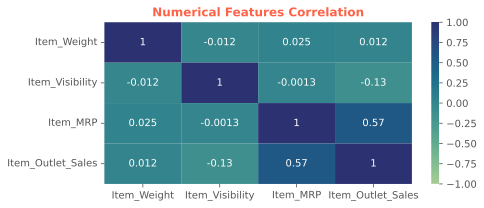

In [21]:
fig, ax = plt.subplots(figsize=(7, 3))
sns.heatmap(df[cols].corr(), vmin=-1, vmax=1, annot=True, cmap='crest', ax = ax)
plt.title("Numerical Features Correlation")
plt.tight_layout()
plt.show()

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(1, 3, figsize=(16, 4), dpi=150, sharey=True)
fig.suptitle("Features Bi-Multi_Variate Analysis", color='navy', weight='bold', fontsize=12)

y = 'Item_Outlet_Sales'
sns.scatterplot(data=df, x='Item_Visibility', y=y, hue='Outlet_Type', size='Item_Fat_Content', sizes=[20, 80], ax=axs[0], marker='o', edgecolor='black', palette="tab20")
sns.scatterplot(data=df, x='Item_Weight', y=y, hue='Outlet_Location_Type', ax=axs[1], marker='o', edgecolor='black', palette="cividis")
sns.scatterplot(data=df, x='Item_MRP', y=y, hue='Outlet_Size', ax=axs[2], marker='o', edgecolor='black', palette="cividis")

plt.tight_layout()

plt.savefig('bi_multi_variate_analysis.png', bbox_inches='tight')

plt.show()


`Observations from Bi and Multivariate Visualization:`
- The heatmap plot shows a positive correlation between sales amount and item maximum retail prices. In contrast, item visibility has a negative correlation with a coefficient of -0.13, indicating that higher visibility does not necessarily lead to higher sales. The scatter plot further illustrates that items with maximum visibility often achieve lower sales. This suggests that items with lower sales are often displayed more prominently or for longer periods, reflecting a more realistic rather than ideal scenario.

- The multivariate scatter plot analysis, particularly the first graph, reveals that Supermarket Type3 outlets generate significantly higher sales compared to Supermarket Type1 outlets, despite the latter having relatively higher item visibility.

- There is no strong correlation between item weight and Outlet_Location_Type, as the data points are uniformly distributed without any noticeable positive or negative trend.

- Items categorized as low-fat generally exhibit higher sales amounts compared to other categories.

# **<font color="black" size="6" face="Adobe Garamond Pro">5. Feature Engineering</font>**

**Feature Encoding** 

Most machine learning algorithms operate with numerical values, making it essential to encode categorical variables into numeric form unless they are to be excluded. The choice of encoding method depends on factors such as the number of unique categories and whether the category is nominal or ordinal.
- For nominal categories, where the order of categories is not significant and there are relatively few unique values (e.g., Outlet_Size, Outlet_Type), one-hot encoding is typically used. However, it’s important to note that one-hot encoding can substantially increase the number of features, potentially leading to the "curse of dimensionality" if the number of unique categories is excessively high.
- For ordinal categories, where the order of data is important, label encoding is more appropriate.

**Feature Engineering**. 
Feature engineering involves using domain knowledge to create features that enhance the performance of machine learning algorithms.
- From exploratory data analysis (EDA), we observed that the Item_Identifier feature contains 1559 nominal categories. Applying one-hot encoding directly would significantly expand the dataset's dimensions. However, closer examination reveals that these categories can be grouped into three types based on their prefixes: FD (Food), DR (Drink), or NC (Non-Consumable). Therefore, we drop the original Item_Identifier feature and create a new categorical feature reflecting these groups, then apply one-hot encoding to this new feature.
- Instead of using the Establishment_Year directly, we can create a new feature called Outlet_Age, which is calculated from the current year.

For tree-based algorithms such as decision trees, random forests, or XGBoost, label encoding may suffice, as these algorithms can handle categorical variables as numerical values. Nonetheless, it is crucial to ensure that the encoding does not inadvertently introduce an ordinal relationship between categories.

In [24]:
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    unique_counts = df[col].nunique()  
    unique_values = df[col].unique()[:20]  #list only 20 of them, if its more than that
    print(f"{col} --> {unique_counts} unique values. Sample includes:- \n{unique_values.tolist()}")
    print("---"*8)

Item_Identifier --> 1559 unique values. Sample includes:- 
['FDA15', 'DRC01', 'FDN15', 'FDX07', 'NCD19', 'FDP36', 'FDO10', 'FDP10', 'FDH17', 'FDU28', 'FDY07', 'FDA03', 'FDX32', 'FDS46', 'FDF32', 'FDP49', 'NCB42', 'DRI11', 'FDU02', 'FDN22']
------------------------
Item_Fat_Content --> 2 unique values. Sample includes:- 
['Low Fat', 'Regular']
------------------------
Item_Type --> 16 unique values. Sample includes:- 
['Dairy', 'Soft Drinks', 'Meat', 'Fruits and Vegetables', 'Household', 'Baking Goods', 'Snack Foods', 'Frozen Foods', 'Breakfast', 'Health and Hygiene', 'Hard Drinks', 'Canned', 'Breads', 'Starchy Foods', 'Others', 'Seafood']
------------------------
Outlet_Identifier --> 10 unique values. Sample includes:- 
['OUT049', 'OUT018', 'OUT010', 'OUT013', 'OUT027', 'OUT045', 'OUT017', 'OUT046', 'OUT035', 'OUT019']
------------------------
Outlet_Establishment_Year --> 9 unique values. Sample includes:- 
['1999', '2009', '1998', '1987', '1985', '2002', '2007', '1997', '2004']
----

In Summary

Label Encoding is applied to the following features:
- Item_Fat_Content: Direct label encoding.
- Outlet_Establishment_Year: Replace the year with Outlet_Age, calculated from the current year.
- Outlet_Size: Map categories 'Small', 'Medium', and 'High' to 1, 2, and 3, respectively, to reflect ordinality.
- Outlet_Location_Type: Map categories ['Tier 1', 'Tier 2', 'Tier 3'] to 1, 2, and 3, representing ordinality.
- Outlet_Type: Direct label encoding.
- Item_Identifier: Due to the high number of unique values, one-hot encoding would cause a dimensionality issue, so label encoding is used.

One-Hot Encoding is applied to the following features:
- Item_Identifier
- Item_Type
- Outlet_Identifier

`5.1 Label Encoding`

In [25]:
# convert Establishement year to age of the outlet-create new feature
current_year = 2024
df['Outlet_Establishment_Year'] = current_year - df['Outlet_Establishment_Year'].astype(int)
df.rename(columns={'Outlet_Establishment_Year': 'Outlet_Age'}, inplace=True)

df['Outlet_Size'].replace({'Small': 1, 'Medium': 2, 'High': 3}, inplace=True)
df['Outlet_Location_Type'].replace({'Tier 1': 1, 'Tier 2': 2, 'Tier 3': 3}, inplace=True)

cols_le =  ['Item_Fat_Content', 'Outlet_Type']
le = LabelEncoder()
for col in cols_le:
    df[col] = le.fit_transform(df[col])
print("Shape of the training set after label encoding:", df.shape)

Shape of the training set after label encoding: (8523, 12)


`5.2 Apply OneHotEncoding`

In [26]:
#first categorize item identifier into three ccategorical_features using the first two initials
df['Item_Identifier'] = df['Item_Identifier'].str[:2]

cols_ohe = ['Item_Identifier', 'Item_Type', 'Outlet_Identifier']
ohe = OneHotEncoder() 
ohe_features = ohe.fit_transform(df[cols_ohe])
ohe_df = pd.DataFrame(ohe_features.toarray(), columns=ohe.get_feature_names_out(cols_ohe))
df = pd.concat([df, ohe_df], axis=1)
df.drop(cols_ohe, axis=1, inplace=True)
df.columns = df.columns.str.replace(' ', '_')
print("Shape of the training set after OneHotencoding:", df.shape)

Shape of the training set after OneHotencoding: (8523, 38)


After featuere engineering, the training dataset now have 37 features and a target.

# **<font color="black" size="6" face="Adobe Garamond Pro">6. Model Selection and Evaluation</font>**
**`Model Selection`**

Model selection involves picking the best algorithm or model design for a specific job. Candidate Machine Learning algorithms we are implimenting includes.

**Linear Regression**: models the relationship between a dependent variable and one or more independent variables by fitting a linear equation to the observed data. 
The model: $ y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_p x_p + \epsilon $ <br>
where 
|Variable|Description|
|-------|-----------|
|$ y $| the dependent variable|
|$ x_1, x_2, \ldots, x_p $| independent variables|
|$\beta_0 $| is the intercept|
|$ \beta_1, \beta_2, \ldots, \beta_p  $| the coefficients|
|$ \epsilon $,| ts the error term|

**Ridge Regression**:  is a type of linear regression that includes a regularization term to prevent overfitting by penalizing large coefficients.<br>
The model: $y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_p x_p + \epsilon$ <br>
Objective function to minimize: $\text{min} \left\{ \sum_{i=1}^n (y_i - \beta_0 - \sum_{j=1}^p \beta_j x_{ij})^2 + \lambda \sum_{j=1}^p \beta_j^2 \right\}$ <br>
Where: $\lambda$ is the regularization parameter.

**Lasso Regression1**: performs linear regression with L1 regularization, which can shrink some coefficients to zero, effectively performing feature selection.<br>
The model: $y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_p x_p + \epsilon$
Objective function to minimize: $\text{min} \left\{ \sum_{i=1}^n (y_i - \beta_0 - \sum_{j=1}^p \beta_j x_{ij})^2 + \lambda \sum_{j=1}^p |\beta_j| \right\}$ <br> 
Where: - $\lambda$ is the regularization parameter.

**Elastic Net Regression**: combines L1 and L2 regularization to overcome the limitations of both Ridge and Lasso regressions, particularly useful for datasets with highly correlated features.<br>
$y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_p x_p + \epsilon$ <br>

Objective function to minimize: $\text{min} \left\{ \sum_{i=1}^n (y_i - \beta_0 - \sum_{j=1}^p \beta_j x_{ij})^2 + \lambda_1 \sum_{j=1}^p |\beta_j| + \lambda_2 \sum_{j=1}^p \beta_j^2 \right\}$ <br>
Where: - $\lambda_1$ and $\lambda_2$ are the regularization parameters.


**Support Vector Regression (SVR)**:  aims to find a function that deviates from the actual observed values by a value no greater than a specified margin $\epsilon$ and is as flat as possible.<br>
The model: $f(x) = \langle w, x \rangle + b$

Objective function to minimize: $\frac{1}{2} \|w\|^2 + C \sum_{i=1}^n \max(0, |y_i - f(x_i)| - \epsilon)$

Where:
- $\langle w, x \rangle$ is the dot product.
- $C$ is the regularization parameter.
- $\epsilon$ is the margin of tolerance.

**Decision Tree Regression**: models the target variable by learning simple decision rules inferred from the data features.
The model:
- The tree is built by splitting the data at each node based on the feature that minimizes the mean squared error (MSE) of the target variable.<br>
Mean Squared Error (MSE): $\text{MSE} = \frac{1}{n} \sum_{i=1}^n (y_i - \hat{y}_i)^2$

**Random Forest Regression**: uses an ensemble of decision trees, where each tree is built on a random subset of the data and features, and the final prediction is an average of all trees' predictions.
<br>
The model: $\hat{y} = \frac{1}{T} \sum_{t=1}^T \hat{y}^{(t)}$
Where:
- $T$ is the number of trees.
- $\hat{y}^{(t)}$ is the prediction from the $t$-th tree.

**K-Nearest Neighbors (KNN) Regression**: predicts the target value of a new data point based on the average of the target values of its $k$ nearest neighbors in the training set.<br>

**XGBoost Regression** is  an optimized gradient boosting library designed to be highly efficient, flexible, and portable. It builds an ensemble of trees sequentially, each one correcting the errors of the previous ones.

**`Model Evaluation`**

For evaluating the performance of our models, We will use R-squared ($R^2$) and  Root Mean Squared Error (RMSE). 
**R-squared ($R^2$)**

R-squared, also known as the coefficient of determination, is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable. It ranges from 0 to 1, where 1 indicates a perfect fit, meaning the model explains all the variability of the response data around its mean. A lower R2 value suggests that the model does not explain much of the variability in the dependent variable and may indicate poor model performance. If$\hat{y}_i$ is the predicted value of the $i$-th element, and $y_i$ is the corresponding true value, then for all $n$ elements, $R^2$ is calculated as:

\begin{equation*}
R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2},
\end{equation*}
where $\bar{y}$ is the mean of the true values $y_i$.


**Root Mean Squared Error (RMSE):**
The Root Mean Squared Error (RMSE) is a standard way to measure the error of a model in predicting quantitative data. easures the average magnitude of the residuals (the differences between predicted and actual values) by taking the square root of the average of squared residuals. RMSE provides a single number that represents the typical difference between predicted and actual values, with lower values indicating better model performance.

If $\hat{y}_i$ is the predicted value of the $i$-th element, and $y_i$ is the corresponding true value, then for all $n$ elements, RMSE is calculated as:

\begin{equation*}
\text{RMSE}(y, \hat{y}) = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}.
\end{equation*}


`Split the data to train and set set`:
Before, model selection and evaluation we first split the data into two parts: training and testing sets. We use the training set to teach the model and the testing set to see how well it works.

In [28]:
# separate the target variable and the features
y = df['Item_Outlet_Sales']
X = df.drop('Item_Outlet_Sales', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("Train set shapes:", X_train.shape, y_train.shape, '\n',
      "Test set shapes:", X_test.shape, y_test.shape)

Train set shapes: (6818, 37) (6818,) 
 Test set shapes: (1705, 37) (1705,)


In [29]:
# Create a list of models to evaluate
models = []
models.append(('LR', LinearRegression())) 
models.append(('Ridge', Ridge()))  
models.append(('Lasso', Lasso()))  
models.append(('Elastic', ElasticNet()))  
models.append(('SVR', SVR())) 
models.append(('DecisionTree', DecisionTreeRegressor())) 
models.append(('RandomForest', RandomForestRegressor())) 
models.append(('KNN', KNeighborsRegressor())) 
models.append(('XGB', XGBRegressor())) 

# Base line Model evaluation
results = {'Model': [], 'R2': [], 'MAE': [], 'RMSE': []}
for name, model in models:
    cv_results_r2 = cross_val_score(model, X_train, y_train, scoring='r2')
    cv_results_mae = cross_val_score(model, X_train, y_train, scoring='neg_mean_absolute_error')
    cv_results_rmse = np.sqrt(-cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error'))

    results['Model'].append(name)
    results['R2'].append("{:.3f}".format(cv_results_r2.mean()))
    results['MAE'].append("{:.3f}".format(-cv_results_mae.mean()))
    results['RMSE'].append("{:.3f}".format(cv_results_rmse.mean()))

# Convert results to DataFrame for easier manipulation
results_df = pd.DataFrame(results)
print("Baseline model evaluation:\n", results_df)

Baseline model evaluation:
           Model     R2       MAE      RMSE
0            LR  0.554   851.902  1147.916
1         Ridge  0.554   851.824  1147.870
2         Lasso  0.555   850.481  1146.757
3       Elastic  0.473   921.631  1248.251
4           SVR  0.152  1160.490  1583.458
5  DecisionTree  0.205  1079.507  1541.825
6  RandomForest  0.557   801.069  1146.674
7           KNN  0.481   884.375  1238.652
8           XGB  0.515   840.114  1197.371


# **<font color="black" size="6" face="Adobe Garamond Pro">7. Hyperparameter Tuning</font>**
The goal here is to find the best set of hyperparameters for a best performing models on the base line evaluation, which significantly affects its performance. It seems all the models performing fairly, Hence we consider all of them of hpyerparaters tuning. Among the different techniques, we use grid search approach.

In [30]:
# Define models with their corresponding parameters
models = [
    ('LinearRegression', Pipeline([('scaler', StandardScaler()),
                                    ('poly', PolynomialFeatures(degree=2)),
                                    ('model', LinearRegression())]), {}),
    ('Ridge', Pipeline([('scaler', StandardScaler()), 
                        ('poly', PolynomialFeatures(degree=2)),
                        ('model', Ridge(alpha=7, fit_intercept=True))]), {'model__alpha': [1, 5, 7, 10]}),
    ('Lasso', Pipeline([('scaler', StandardScaler()),
                        ('poly', PolynomialFeatures(degree=2)),
                        ('model', Lasso(alpha=0.2, fit_intercept=True))]), {'model__alpha': [0.1, 0.2, 0.5, 1]}),
    ('ElasticNet', Pipeline([('scaler', StandardScaler()),
                              ('poly', PolynomialFeatures(degree=2)),
                              ('model', ElasticNet(alpha=0.1, l1_ratio=0.5))]), {'model__alpha': [0.1, 0.2, 0.5, 1],
                                                                                 'model__l1_ratio': [0.2, 0.5, 0.8]}),
    ('SVR', SVR(), {'C': [0.1, 1, 10], 
                    'epsilon': [0.01, 0.1, 1], 
                    'kernel': ['linear', 'poly', 'rbf'], 
                    'degree': [3, 4, 5]}),
    ('DecisionTree', DecisionTreeRegressor(), {'max_depth': [None, 10, 20, 50], 
                                               'criterion': ['mse', 'friedman_mse', 'mae'], 
                                               'min_samples_split': [2, 10, 20], 
                                               'min_samples_leaf': [1, 5, 10]}),
    ('RandomForest', RandomForestRegressor(), {'n_estimators': [100, 200, 500], 
                                               'max_depth': [None, 10, 20], 
                                               'min_samples_split': [2, 10, 20], 
                                               'min_samples_leaf': [1, 5, 10]}),
    ('KNN', KNeighborsRegressor(), {'n_neighbors': [3, 5, 7, 10], 
                                    'weights': ['uniform', 'distance'],
                                    'algorithm': ['auto', 'ball_tree', 'kd_tree']}),
    ('XGB', XGBRegressor(), {'learning_rate': [0.05, 0.1, 0.2], 
                             'n_estimators': [100, 200, 500],  
                             'subsample': [0.8, 0.9, 1.0], 
                             'max_depth': [5, 6, 7],'gamma': [0, 0.1, 0.2]})
]

# Function to evaluate model performance on a given dataset
def evaluate_model(model, X, y):
    y_pred = model.predict(X)
    mse = mean_squared_error(y, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y, y_pred)
    return rmse, r2

# Function to perform hyperparameter tuning and evaluate on training set
def evaluate_training(models, X_train, y_train):
    results = {'Model': [], 'Train_R2': [], 'Train_RMSE': []}
    k_fold = KFold(n_splits=5, shuffle=True, random_state=42)

    for name, model, params in models:
        grid_search = GridSearchCV(model, params, cv=k_fold, scoring='neg_mean_squared_error')
        grid_search.fit(X_train, y_train)
        print(f"Best {name} Model's Parameters: {grid_search.best_params_}")
        best_model = grid_search.best_estimator_
        train_rmse, train_r2 = evaluate_model(best_model, X_train, y_train)

        results['Model'].append(name)
        results['Train_R2'].append(train_r2)
        results['Train_RMSE'].append(train_rmse)

    print('===='*8)
    
    results_df = pd.DataFrame(results)
    print(results_df)
    return results_df
train_results_df = evaluate_training(models, X_train, y_train)

Best LinearRegression Model's Parameters: {}
Best Ridge Model's Parameters: {'model__alpha': 10}
Best Lasso Model's Parameters: {'model__alpha': 1}
Best ElasticNet Model's Parameters: {'model__alpha': 0.2, 'model__l1_ratio': 0.8}
Best SVR Model's Parameters: {'C': 10, 'degree': 3, 'epsilon': 1, 'kernel': 'linear'}
Best DecisionTree Model's Parameters: {'criterion': 'friedman_mse', 'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best RandomForest Model's Parameters: {'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 2, 'n_estimators': 200}
Best KNN Model's Parameters: {'algorithm': 'auto', 'n_neighbors': 10, 'weights': 'distance'}
Best XGB Model's Parameters: {'gamma': 0, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.9}
              Model  Train_R2   Train_RMSE
0  LinearRegression  0.616396  1065.232935
1             Ridge  0.616793  1064.680766
2             Lasso  0.616610  1064.934981
3        ElasticNet  0.616116  1065.62153

In [31]:
# Updated models with best hyperparameters obtained from the training phase
optimized_models = [
    ('LinearRegression', Pipeline([('scaler', StandardScaler()),
                                    ('poly', PolynomialFeatures(degree=2)),
                                    ('model', LinearRegression())]), {}),
    ('Ridge', Pipeline([('scaler', StandardScaler()), 
                        ('poly', PolynomialFeatures(degree=2)),
                        ('model', Ridge(alpha=10, fit_intercept=True))]), {}),
    ('Lasso', Pipeline([('scaler', StandardScaler()),
                        ('poly', PolynomialFeatures(degree=2)),
                        ('model', Lasso(alpha=1, fit_intercept=True))]), {}),
    ('ElasticNet', Pipeline([('scaler', StandardScaler()),
                              ('poly', PolynomialFeatures(degree=2)),
                              ('model', ElasticNet(alpha=0.2, l1_ratio=0.8))]), {}),
    ('SVR', SVR(C=10, degree=3, epsilon=1, kernel='linear'), {}),
    ('DecisionTree', DecisionTreeRegressor(criterion = 'friedman_mse', max_depth=10, min_samples_leaf=10, min_samples_split=10), {}),
    ('RandomForest', RandomForestRegressor(n_estimators=500, max_depth=10, min_samples_leaf = 10, min_samples_split = 20), {}),
    ('KNN', KNeighborsRegressor(n_neighbors=10, algorithm = 'auto',  weights='distance'), {}),
    ('XGB', XGBRegressor(gamma=0, learning_rate=0.05, max_depth=5, n_estimators=100, subsample=0.9), {})
]

# Function to evaluate models on the test set
def evaluate_testing(models, X_test, y_test):
    results = {'Model': [], 'Test_R2': [], 'Test_RMSE': []}

    for name, model, params in models:
        best_model = model.set_params(**params)
        best_model.fit(X_train, y_train)  # Refit on entire training data

        # Evaluate the model on the test set
        test_rmse, test_r2 = evaluate_model(best_model, X_test, y_test)

        results['Model'].append(name)
        results['Test_R2'].append(test_r2)
        results['Test_RMSE'].append(test_rmse)

    print('\n     Model Performances on testing_set after hyperparameter tuning\n', "￣ ￣ ￣"*10)

    
    results_df = pd.DataFrame(results)
    print(results_df)
    return results_df
test_results_df = evaluate_testing(optimized_models, X_test, y_test)


     Model Performances on testing_set after hyperparameter tuning
 ￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣￣ ￣ ￣
              Model   Test_R2    Test_RMSE
0  LinearRegression  0.608187  1031.956850
1             Ridge  0.609562  1030.144574
2             Lasso  0.612145  1026.732193
3        ElasticNet  0.611873  1027.091207
4               SVR  0.568191  1083.348572
5      DecisionTree  0.560874  1092.488609
6      RandomForest  0.610134  1029.390500
7               KNN  0.521943  1139.887974
8               XGB  0.609568  1030.136759


Seems, KNN is overfitting on the training test, as testing set results is no better than other models.

# **<font color="black" size="6" face="Adobe Garamond Pro">8. Create Feature importance from model and Save the model</font>**

In [34]:
import plotly.express as px
import plotly.io as pio
import pandas as pd
from xgboost import XGBRegressor

# Fit the XGB model
xgb_model = XGBRegressor(gamma=0, learning_rate=0.05, max_depth=5, n_estimators=100, subsample=0.9)
xgb_model.fit(X_train, y_train)

# Extract feature importances
importances = xgb_model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame for plotting
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot using Plotly
fig = px.bar(feature_importance_df, x='Feature', y='Importance', title='Feature Importance for XGBRegressor')
fig.update_layout(height=500)
fig.update_traces(marker_line_color='black', marker_line_width=1, opacity=1)
fig.update_xaxes(showgrid=False, rangemode='nonnegative')
fig.update_yaxes(showgrid=False, rangemode='nonnegative')

# Show the plot
fig.show()

# Save the plot as an image
pio.write_image(fig, 'feature_importance_xgb.png')

Outlet type, Item Maximum retail price and outlet age are the three most important features.

In [33]:
#save model
xgb_model.save_model('xgb_model.json')

/var/folders/9v/qmwwzl612wj3skrcvvb2jjp80000gn/T/ipykernel_34918/338553756.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Train_R2', y='Model', data=df, palette='viridis')
/var/folders/9v/qmwwzl612wj3skrcvvb2jjp80000gn/T/ipykernel_34918/338553756.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Train_RMSE', y='Model', data=df, palette='magma')


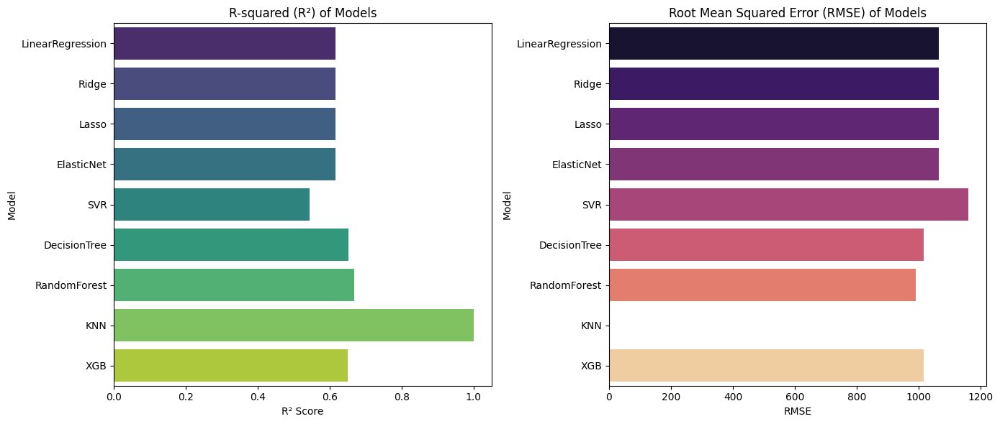

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data for models
data = {
    'Model': ['LinearRegression', 'Ridge', 'Lasso', 'ElasticNet', 'SVR', 
              'DecisionTree', 'RandomForest', 'KNN', 'XGB'],
    'Train_R2': [0.616396, 0.616793, 0.616610, 0.616116, 0.543838, 
                 0.651388, 0.668508, 1.000000, 0.650823],
    'Train_RMSE': [1065.232935, 1064.680766, 1064.934981, 1065.621533, 
                   1161.615086, 1015.485803, 990.237219, 0.006126, 1016.309246]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Plotting R2 values
plt.figure(figsize=(14, 6))

# R2 Score plot
plt.subplot(1, 2, 1)
sns.barplot(x='Train_R2', y='Model', data=df, palette='viridis')
plt.title('R-squared (R²) of Models')
plt.xlabel('R² Score')
plt.ylabel('Model')

# RMSE plot
plt.subplot(1, 2, 2)
sns.barplot(x='Train_RMSE', y='Model', data=df, palette='magma')
plt.title('Root Mean Squared Error (RMSE) of Models')
plt.xlabel('RMSE')
plt.ylabel('Model')

plt.tight_layout()
plt.show()